In [24]:
import numpy as np
import pandas as pd
from sklearn import manifold, datasets, decomposition
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
from ipywidgets import interact, fixed
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from matplotlib.patches import Ellipse
from scipy import linalg
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_absolute_percentage_error, mean_squared_error
import os
from sklearn.cluster import KMeans
import osmnx as ox
import geopandas as gpd
#import plotly.express as px
import urllib.request
import zipfile

import matplotlib.colors as mcolors
from matplotlib.ticker import FuncFormatter
from sklearn.decomposition import PCA, FactorAnalysis
from factor_analyzer import FactorAnalyzer, calculate_kmo, calculate_bartlett_sphericity

from matplotlib.ticker import ScalarFormatter

from sklearn.decomposition import PCA

import os
os.environ["OMP_NUM_THREADS"] = "2"

In [25]:
df = pd.read_csv('../../data/tidy/completed-dataset.csv')

cols = df.columns[1:]  # Exclude the first column
for col in cols:
    df[col] = pd.to_numeric(df[col].astype(str).str.replace(',', ''), errors='coerce')
    
df

,msa,Node count,Edge count,Degree average,Edge length total (km),Edge length average (km),Streets per node average,Intersection count,Street length total (km),Street segment count,...,"Developed, Low Intensity","Developed, Medium Intensity","Developed, Open Space",Emergent Herbaceous Wetlands,Evergreen Forest,Grassland/Herbaceous,Mixed Forest,Open Water,Pasture/Hay,Shrubland
0,"Abilene, TX",14357.0,39401.0,5.488751,17168.965935,0.435749,2.881452,11912.0,8925.436120,20606.0,...,108973.0,76541.0,258626.0,2087.0,473501.0,638685.0,23295.0,47490.0,28297.0,3980466.0
1,"Akron, OH",26865.0,70900.0,5.278243,15191.985931,0.214273,2.756896,21200.0,8039.294972,36980.0,...,368917.0,181242.0,354969.0,22025.0,7673.0,25169.0,66296.0,64747.0,384584.0,8219.0
2,"Albany, GA",8466.0,22838.0,5.395228,9545.102272,0.417948,2.837468,6957.0,4989.592979,11954.0,...,143836.0,46683.0,208229.0,53826.0,1247126.0,159669.0,253748.0,58219.0,39741.0,79667.0
3,"Albany-Lebanon, OR",7132.0,17906.0,5.021312,8280.294430,0.462431,2.568144,5101.0,4225.438910,9147.0,...,76593.0,55590.0,86436.0,42935.0,3811640.0,284662.0,76560.0,52290.0,1167763.0,491627.0
4,"Albany-Schenectady-Troy, NY",36977.0,96867.0,5.239311,27872.441864,0.287739,2.755794,30254.0,14555.424691,50900.0,...,363813.0,227610.0,500605.0,68212.0,952523.0,75086.0,1835704.0,172390.0,1126778.0,57824.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,"Yakima, WA",10920.0,28902.0,5.293407,14155.026874,0.489759,2.709982,8275.0,7249.500452,14773.0,...,141547.0,79800.0,153208.0,134320.0,718608.0,75251.0,28921.0,125193.0,4793.0,123171.0
345,"York-Hanover, PA",16622.0,44476.0,5.351462,13291.255851,0.298841,2.781194,13507.0,6831.204674,23064.0,...,324414.0,127264.0,643575.0,4211.0,347841.0,117114.0,475535.0,79155.0,1106545.0,106990.0
346,"Youngstown-Warren-Boardman, OH-PA",24885.0,66650.0,5.356641,19738.540791,0.296152,2.794736,19982.0,10381.621775,34674.0,...,337495.0,296595.0,347027.0,50227.0,437405.0,66256.0,1253599.0,198166.0,271529.0,52538.0
347,"Yuba City, CA",8419.0,21665.0,5.146692,7925.868395,0.365837,2.678465,6360.0,4094.273240,11260.0,...,211223.0,104022.0,268798.0,88246.0,3773414.0,3621831.0,5845.0,53340.0,75506.0,2269078.0


In [26]:
# List of columns to extract
columns_to_extract = ['msa', 'Carbon Dioxide (Ton)', 'Methane (Ton)', 'Nitrous Oxide (Ton)']

# Create a new DataFrame with the specified columns
gas_df = df[columns_to_extract]
gas_df

,msa,Carbon Dioxide (Ton),Methane (Ton),Nitrous Oxide (Ton)
0,"Abilene, TX",5.326790e+05,27.982048,5.061424
1,"Akron, OH",2.007387e+06,167.528086,25.020546
2,"Albany, GA",2.638313e+05,20.830185,4.532440
3,"Albany-Lebanon, OR",9.552332e+05,98.024056,21.206253
4,"Albany-Schenectady-Troy, NY",8.783815e+05,57.610234,11.738693
...,...,...,...,...
344,"Yakima, WA",1.332427e+06,151.627668,32.085481
345,"York-Hanover, PA",2.067360e+06,219.975493,47.809417
346,"Youngstown-Warren-Boardman, OH-PA",1.022715e+06,100.220975,15.492664
347,"Yuba City, CA",2.886964e+05,7.997358,3.849678


In [27]:
factors_df = df.drop(columns=columns_to_extract[1:])

# Replace leading spaces in column names for easier reference
factors_df.columns = factors_df.columns.str.strip()

factors_df = factors_df.drop(columns=['Taxicab, motorcycle, or other means'])

In [28]:
factors_df['Population density (people/sq km)'] = factors_df['Total population']/factors_df['Area (sq km)']

In [29]:
cols_to_sum = ['Barren Land (Rock/Sand/Clay)',
       'Cultivated Crops', 'Deciduous Forest', 'Developed, High Intensity',
       'Developed, Low Intensity', 'Developed, Medium Intensity',
       'Developed, Open Space', 'Emergent Herbaceous Wetlands',
       'Evergreen Forest', 'Grassland/Herbaceous', 'Mixed Forest',
       'Open Water', 'Pasture/Hay', 'Shrubland']

row_sum = factors_df[cols_to_sum].sum(axis=1)
row_sum

0       7925393.0
1       2540242.0
2       4483626.0
3       6585394.0
4       7646786.0
          ...    
344     1904862.0
345     5833680.0
346     5319714.0
347    12267610.0
348     2605919.0
Length: 349, dtype: float64

In [30]:
factors_df.drop(columns=['Liquefied Petroleum Gas (miles)'], inplace=True)


In [31]:
factors_df.drop(columns=['Agriculture, forestry, fishing and hunting, and mining',
       'Construction', 'Manufacturing', 'Wholesale trade', 'Retail trade',
       'Transportation and warehousing, and utilities', 'Information',
       'Finance and insurance, and real estate and rental and leasing',
       'Professional, scientific, and management, and administrative and waste management services',
       'Educational services, and health care and social assistance',
       'Arts, entertainment, and recreation, and accommodation and food services',
       'Other services, except public administration', 'Public administration','Barren Land (Rock/Sand/Clay)', 'Cultivated Crops', 'Deciduous Forest','Emergent Herbaceous Wetlands', 'Evergreen Forest',
       'Grassland/Herbaceous', 'Mixed Forest', 'Open Water', 'Pasture/Hay',
       'Shrubland','msa_CDD'], inplace=True)

In [32]:
factors_df

,msa,Node count,Edge count,Degree average,Edge length total (km),Edge length average (km),Streets per node average,Intersection count,Street length total (km),Street segment count,...,Cooling Degree Days,Heating Degree Days,Palmer Z Index,Average Temperature (F),Precipitation (inches),"Developed, High Intensity","Developed, Low Intensity","Developed, Medium Intensity","Developed, Open Space",Population density (people/sq km)
0,"Abilene, TX",14357.0,39401.0,5.488751,17168.965935,0.435749,2.881452,11912.0,8925.436120,20606.0,...,2383.00,2332.000000,0.340000,65.000000,27.356667,27003.0,108973.0,76541.0,258626.0,24.019917
1,"Akron, OH",26865.0,70900.0,5.278243,15191.985931,0.214273,2.756896,21200.0,8039.294972,36980.0,...,823.00,5338.000000,0.165000,52.500000,40.550000,65804.0,368917.0,181242.0,354969.0,294.018910
2,"Albany, GA",8466.0,22838.0,5.395228,9545.102272,0.417948,2.837468,6957.0,4989.592979,11954.0,...,2546.75,1526.000000,0.547500,67.725000,58.845000,19771.0,143836.0,46683.0,208229.0,35.333378
3,"Albany-Lebanon, OR",7132.0,17906.0,5.021312,8280.294430,0.462431,2.568144,5101.0,4225.438910,9147.0,...,163.00,5550.000000,-0.350000,50.200000,65.670000,22567.0,76593.0,55590.0,86436.0,21.285743
4,"Albany-Schenectady-Troy, NY",36977.0,96867.0,5.239311,27872.441864,0.287739,2.755794,30254.0,14555.424691,50900.0,...,529.40,6367.200000,-0.396000,48.860000,37.660000,90837.0,363813.0,227610.0,500605.0,118.206895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,"Yakima, WA",10920.0,28902.0,5.293407,14155.026874,0.489759,2.709982,8275.0,7249.500452,14773.0,...,254.00,6455.000000,-0.860000,47.900000,22.810000,23831.0,141547.0,79800.0,153208.0,22.459825
345,"York-Hanover, PA",16622.0,44476.0,5.351462,13291.255851,0.298841,2.781194,13507.0,6831.204674,23064.0,...,1050.00,4662.000000,-0.220000,55.000000,42.820000,49074.0,324414.0,127264.0,643575.0,189.847748
346,"Youngstown-Warren-Boardman, OH-PA",24885.0,66650.0,5.356641,19738.540791,0.296152,2.794736,19982.0,10381.621775,34674.0,...,643.00,5695.333333,0.783333,51.033333,45.596667,101135.0,337495.0,296595.0,347027.0,119.182102
347,"Yuba City, CA",8419.0,21665.0,5.146692,7925.868395,0.365837,2.678465,6360.0,4094.273240,11260.0,...,1969.50,2338.000000,-1.580000,63.950000,12.295000,26821.0,211223.0,104022.0,268798.0,53.631459


In [33]:
# Select the columns you want to normalize (e.g., 'A', 'B', 'C', 'D')
cols_to_normalize = ['Developed, High Intensity', 'Developed, Low Intensity',
       'Developed, Medium Intensity', 'Developed, Open Space']

# row_sum = factors_df[cols_to_normalize].sum(axis=1)
# Divide each selected column by the sum of that row and replace in the original DataFrame
# factors_df[cols_to_normalize] = factors_df[cols_to_normalize].div(row_sum, axis=0)*100


row_sum_1 = factors_df[cols_to_normalize].sum(axis=1)

# # Divide each selected column by the sum of that row and replace in the original DataFrame
factors_df['proportion of openland area'] = row_sum_1/row_sum*100
# factors_df[cols_to_normalize] = factors_df[cols_to_normalize].div(row_sum, axis=0)*100
factors_df

,msa,Node count,Edge count,Degree average,Edge length total (km),Edge length average (km),Streets per node average,Intersection count,Street length total (km),Street segment count,...,Heating Degree Days,Palmer Z Index,Average Temperature (F),Precipitation (inches),"Developed, High Intensity","Developed, Low Intensity","Developed, Medium Intensity","Developed, Open Space",Population density (people/sq km),proportion of openland area
0,"Abilene, TX",14357.0,39401.0,5.488751,17168.965935,0.435749,2.881452,11912.0,8925.436120,20606.0,...,2332.000000,0.340000,65.000000,27.356667,27003.0,108973.0,76541.0,258626.0,24.019917,5.944727
1,"Akron, OH",26865.0,70900.0,5.278243,15191.985931,0.214273,2.756896,21200.0,8039.294972,36980.0,...,5338.000000,0.165000,52.500000,40.550000,65804.0,368917.0,181242.0,354969.0,294.018910,38.222028
2,"Albany, GA",8466.0,22838.0,5.395228,9545.102272,0.417948,2.837468,6957.0,4989.592979,11954.0,...,1526.000000,0.547500,67.725000,58.845000,19771.0,143836.0,46683.0,208229.0,35.333378,9.334387
3,"Albany-Lebanon, OR",7132.0,17906.0,5.021312,8280.294430,0.462431,2.568144,5101.0,4225.438910,9147.0,...,5550.000000,-0.350000,50.200000,65.670000,22567.0,76593.0,55590.0,86436.0,21.285743,3.662438
4,"Albany-Schenectady-Troy, NY",36977.0,96867.0,5.239311,27872.441864,0.287739,2.755794,30254.0,14555.424691,50900.0,...,6367.200000,-0.396000,48.860000,37.660000,90837.0,363813.0,227610.0,500605.0,118.206895,15.468786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,"Yakima, WA",10920.0,28902.0,5.293407,14155.026874,0.489759,2.709982,8275.0,7249.500452,14773.0,...,6455.000000,-0.860000,47.900000,22.810000,23831.0,141547.0,79800.0,153208.0,22.459825,20.914166
345,"York-Hanover, PA",16622.0,44476.0,5.351462,13291.255851,0.298841,2.781194,13507.0,6831.204674,23064.0,...,4662.000000,-0.220000,55.000000,42.820000,49074.0,324414.0,127264.0,643575.0,189.847748,19.615869
346,"Youngstown-Warren-Boardman, OH-PA",24885.0,66650.0,5.356641,19738.540791,0.296152,2.794736,19982.0,10381.621775,34674.0,...,5695.333333,0.783333,51.033333,45.596667,101135.0,337495.0,296595.0,347027.0,119.182102,20.344176
347,"Yuba City, CA",8419.0,21665.0,5.146692,7925.868395,0.365837,2.678465,6360.0,4094.273240,11260.0,...,2338.000000,-1.580000,63.950000,12.295000,26821.0,211223.0,104022.0,268798.0,53.631459,4.979487


In [34]:
factors_df.drop(columns=['Developed, High Intensity', 'Developed, Low Intensity',
       'Developed, Medium Intensity', 'Developed, Open Space'], inplace=True)


In [35]:
factors_df = factors_df.rename(columns={
    'Street length total (km)': 'Street Length (km)',
    'Intersection density (per sq km)': 'Intersection Density (per sq km)',
    'Street density (km/sq km)': 'Street Density (km/sq km)',
    'Building area (sq km)': 'Building Area (sq km)',
    'Median Income': 'Median Income ($)',
    'Total population': 'Population',
    'Total housing units': 'Housing Units',
    '1 vehicle available': '1 Vehicle Available',
    '2 vehicle available': '2 Vehicle Available',
    '3 or more vehicle available': '3 or More Vehicle Available',
    'No vehicle available': 'No Vehicle Available',
    'GDP': 'GDP ($)',
    'Population density (people/sq km)': 'Population Density (people/sq km)',
    'Car, truck, or van:': 'Personal Vehicle (mode share %)',
    'Public transportation (excluding taxicab):':'Public Transportation (mode share %)',
    'Bicycle':'Bicycle (mode share %)',
    'Walked':'Walked (mode share %)',
    'Worked from home':'Worked from Home (mode share %)',
    'Employment Rate':'Employment Rate (%)',
    'Unemployment Rate':'Unemployment Rate (%)',
    'Liquefied Petroleum Gas (gal equivalent)':'Liquefied Petroleum Gas (GGE)',
    'Compressed Natural Gas (gal equivalent)':'Compressed Natural Gas (GGE)',
    'Other Fuel (gal/gal equivalent)':'Other Fuel (GGE)',
    'Node count':'Node Count',
    'Edge count':'Edge Count',
    'Degree average':'Degree Average',
    'Edge length total (km)':'Edge Length Total (km)',
    'Edge length average (km)':'Edge Length Average (km)',
    'Streets per node average':'Streets per Node Average',
    'Intersection count':'Intersection Count',
    'Street length total (km)':'Street Length Total (km)',
    'Street segment count':'Street Segment Count',
    'Street length average (km)':'Street Length Average (km)',
    'Circuity average':'Circuity Average',
    'Self-loop proportion':'Self-loop Proportion',
    'Node density (per sq km)':'Node Density (per sq km)',
    'Intersection density (per sq km)':'Intersection Density (per sq km)',
    'Edge density (km/sq km)':'Edge Density (km/sq km)',
    'Street density (km/sq km)':'Street Density (km/sq km)',
    'Building area (sq km)':'Building Area (sq km)',
    'Cooling Degree Days':'Cooling Degree Days (°Df)',
    'Heating Degree Days':'Heating Degree Days (°Df)',
    'Average Temperature (F)':'Average Temperature (°F)',
    'proportion of openland area':'Proportion of Built-Up Area'
})

In [36]:
X = factors_df.drop('msa', axis=1)

# Standardizing the Data
scaler = StandardScaler()
data_standardized = scaler.fit_transform(X)

# Convert the standardized data back to a DataFrame
data_standardized = pd.DataFrame(data_standardized, columns=factors_df.columns[1:])


data_standardized.rename(columns={'Household Number': 'Households'}, inplace=True)
data_standardized.rename(columns={'No vehicles available': 'No Vehicles Available'}, inplace=True)
data_standardized.rename(columns={'2 vehicles available': '2 Vehicles Available'}, inplace=True)
data_standardized.rename(columns={'3 or more vehicles available': '3 or More Vehicles Available'}, inplace=True)
data_standardized.rename(columns={'Electric Battery (miles)': 'Transit Electric Battery Vehicle Miles'}, inplace=True)
data_standardized.rename(columns={'Electric Propulsion (miles)': 'Transit Electric Propulsion Vehicle Miles'}, inplace=True)


data_standardized.rename(columns={'Proportion of Built-Up Area': 'Built-Up Area Proportion'}, inplace=True)
data_standardized.rename(columns={'Personal Vehicle (mode share %)': 'Car Mode Share'}, inplace=True)
data_standardized.rename(columns={'Public Transportation (mode share %)': 'Transit Mode Share'}, inplace=True)
data_standardized.rename(columns={'Bicycle (mode share %)': 'Bicycle Mode Share'}, inplace=True)
data_standardized.rename(columns={'Walked (mode share %)': 'Walking Mode Share'}, inplace=True)
data_standardized.rename(columns={'Worked from Home (mode share %)': 'Working from Home Share'}, inplace=True)


data_standardized.rename(columns={'Bio-Diesel (gal)': 'Transit Bio-Diesel (gal)'}, inplace=True)
data_standardized.rename(columns={'Compressed Natural Gas (GGE)': 'Transit Compressed Natural Gas (GGE)'}, inplace=True)
data_standardized.rename(columns={'Diesel (gal)': 'Transit Diesel (gal)'}, inplace=True)
data_standardized.rename(columns={'Electric Battery (kwh)': 'Transit Electric Battery Vehicle Fuel Use (kWh)'}, inplace=True)
data_standardized.rename(columns={'Electric Propulsion (kwh)': 'Transit Electric Propulsion Vehicle Fuel Use (kWh)'}, inplace=True)
data_standardized.rename(columns={'Gasoline (gal)': 'Transit Gasoline Vehicle Fuel Use (gal)'}, inplace=True)
data_standardized.rename(columns={'Liquefied Petroleum Gas (GGE)': 'Transit Liquefied Petroleum Gas (GGE)'}, inplace=True)
data_standardized.rename(columns={'Other Fuel (GGE)': 'Transit Other Fuel (GGE)'}, inplace=True)

data_standardized.rename(columns={'Compressed Natural Gas (miles)': 'Transit Compressed Natural Gas Vehicle Miles'}, inplace=True)
data_standardized.rename(columns={'Diesel (miles)': 'Transit Diesel Vehicle Miles'}, inplace=True)
data_standardized.rename(columns={'Gasoline (miles)': 'Transit Gasoline Vehicle Miles'}, inplace=True)
data_standardized.rename(columns={'Other Fuel (miles)': 'Transit Other Fuel Vehicle Miles'}, inplace=True)


data_standardized.rename(columns={'Intersection Density (per sq km)': 'Intersection Density (/sq km)'}, inplace=True)
data_standardized.rename(columns={'Node Density (per sq km)': 'Node Density (/sq km)'}, inplace=True)
data_standardized.rename(columns={'Housing Unit': 'Housing Units'}, inplace=True)
data_standardized.rename(columns={'Population Density (people/sq km)': 'Population Density (/sq km)'}, inplace=True)
data_standardized.rename(columns={'Walked (mode share %)': 'Walking Mode Share (%)'}, inplace=True)
data_standardized.rename(columns={'Worked from Home (mode share %)': 'Working from Home (%)'}, inplace=True)
data_standardized.rename(columns={'Electric Propulsion (kwh)': 'Electric Propulsion (kWh)'}, inplace=True)

data_standardized.rename(columns={'Precipitation (inches)': 'Precipitation (in)'}, inplace=True)

data_standardized.columns

Index(['Node Count', 'Edge Count', 'Degree Average', 'Edge Length Total (km)',
       'Edge Length Average (km)', 'Streets per Node Average',
       'Intersection Count', 'Street Length Total (km)',
       'Street Segment Count', 'Street Length Average (km)',
       'Circuity Average', 'Self-loop Proportion', 'Node Density (/sq km)',
       'Intersection Density (/sq km)', 'Edge Density (km/sq km)',
       'Street Density (km/sq km)', 'Building Area (sq km)', 'Area (sq km)',
       'Car Mode Share', 'Transit Mode Share', 'Bicycle Mode Share',
       'Walking Mode Share', 'Working from Home Share',
       'Median Household Income', 'Households', 'Employment Rate (%)',
       'Unemployment Rate (%)', 'Population', 'Housing Units',
       'No Vehicles Available', '1 Vehicle Available', '2 Vehicles Available',
       '3 or More Vehicles Available', 'GDP ($)', 'Transit Diesel (gal)',
       'Transit Gasoline Vehicle Fuel Use (gal)',
       'Transit Liquefied Petroleum Gas (GGE)',
       'Tr

In [37]:
factors_df.rename(columns={'Household Number': 'Households'}, inplace=True)
factors_df.rename(columns={'No vehicles available': 'No Vehicles Available'}, inplace=True)
factors_df.rename(columns={'2 vehicles available': '2 Vehicles Available'}, inplace=True)
factors_df.rename(columns={'3 or more vehicles available': '3 or More Vehicles Available'}, inplace=True)
factors_df.rename(columns={'Electric Battery (miles)': 'Transit Electric Battery Vehicle Miles'}, inplace=True)
factors_df.rename(columns={'Electric Propulsion (miles)': 'Transit Electric Propulsion Vehicle Miles'}, inplace=True)


factors_df.rename(columns={'Proportion of Built-Up Area': 'Built-Up Area Proportion'}, inplace=True)
factors_df.rename(columns={'Personal Vehicle (mode share %)': 'Car Mode Share'}, inplace=True)
factors_df.rename(columns={'Public Transportation (mode share %)': 'Transit Mode Share'}, inplace=True)
factors_df.rename(columns={'Bicycle (mode share %)': 'Bicycle Mode Share'}, inplace=True)
factors_df.rename(columns={'Walked (mode share %)': 'Walking Mode Share'}, inplace=True)
factors_df.rename(columns={'Worked from Home (mode share %)': 'Working from Home Share'}, inplace=True)


factors_df.rename(columns={'Bio-Diesel (gal)': 'Transit Bio-Diesel (gal)'}, inplace=True)
factors_df.rename(columns={'Compressed Natural Gas (GGE)': 'Transit Compressed Natural Gas (GGE)'}, inplace=True)
factors_df.rename(columns={'Diesel (gal)': 'Transit Diesel (gal)'}, inplace=True)
factors_df.rename(columns={'Electric Battery (kwh)': 'Transit Electric Battery Vehicle Fuel Use (kWh)'}, inplace=True)
factors_df.rename(columns={'Electric Propulsion (kwh)': 'Transit Electric Propulsion Vehicle Fuel Use (kWh)'}, inplace=True)
factors_df.rename(columns={'Gasoline (gal)': 'Transit Gasoline Vehicle Fuel Use (gal)'}, inplace=True)
factors_df.rename(columns={'Liquefied Petroleum Gas (GGE)': 'Transit Liquefied Petroleum Gas (GGE)'}, inplace=True)
factors_df.rename(columns={'Other Fuel (GGE)': 'Transit Other Fuel (GGE)'}, inplace=True)

factors_df.rename(columns={'Compressed Natural Gas (miles)': 'Transit Compressed Natural Gas Vehicle Miles'}, inplace=True)
factors_df.rename(columns={'Diesel (miles)': 'Transit Diesel Vehicle Miles'}, inplace=True)
factors_df.rename(columns={'Gasoline (miles)': 'Transit Gasoline Vehicle Miles'}, inplace=True)
factors_df.rename(columns={'Other Fuel (miles)': 'Transit Other Fuel Vehicle Miles'}, inplace=True)


factors_df.rename(columns={'Intersection Density (per sq km)': 'Intersection Density (/sq km)'}, inplace=True)
factors_df.rename(columns={'Node Density (per sq km)': 'Node Density (/sq km)'}, inplace=True)
factors_df.rename(columns={'Housing Unit': 'Housing Units'}, inplace=True)
factors_df.rename(columns={'Population Density (people/sq km)': 'Population Density (/sq km)'}, inplace=True)
factors_df.rename(columns={'Walked (mode share %)': 'Walking Mode Share (%)'}, inplace=True)
factors_df.rename(columns={'Worked from Home (mode share %)': 'Working from Home (%)'}, inplace=True)
factors_df.rename(columns={'Electric Propulsion (kwh)': 'Electric Propulsion (kWh)'}, inplace=True)

factors_df.rename(columns={'Precipitation (inches)': 'Precipitation (in)'}, inplace=True)

factors_df.columns

Index(['msa', 'Node Count', 'Edge Count', 'Degree Average',
       'Edge Length Total (km)', 'Edge Length Average (km)',
       'Streets per Node Average', 'Intersection Count',
       'Street Length Total (km)', 'Street Segment Count',
       'Street Length Average (km)', 'Circuity Average',
       'Self-loop Proportion', 'Node Density (/sq km)',
       'Intersection Density (/sq km)', 'Edge Density (km/sq km)',
       'Street Density (km/sq km)', 'Building Area (sq km)', 'Area (sq km)',
       'Car Mode Share', 'Transit Mode Share', 'Bicycle Mode Share',
       'Walking Mode Share', 'Working from Home Share',
       'Median Household Income', 'Households', 'Employment Rate (%)',
       'Unemployment Rate (%)', 'Population', 'Housing Units',
       'No Vehicles Available', '1 Vehicle Available', '2 Vehicles Available',
       '3 or More Vehicles Available', 'GDP ($)', 'Transit Diesel (gal)',
       'Transit Gasoline Vehicle Fuel Use (gal)',
       'Transit Liquefied Petroleum Gas (GGE

In [38]:
factors_df.to_csv('../../data/tidy/raw-data-cleaned.csv', index=False)
factors_df

,msa,Node Count,Edge Count,Degree Average,Edge Length Total (km),Edge Length Average (km),Streets per Node Average,Intersection Count,Street Length Total (km),Street Segment Count,...,Transit Other Fuel Vehicle Miles,Transit Electric Propulsion Vehicle Miles,Transit Electric Battery Vehicle Miles,Cooling Degree Days (°Df),Heating Degree Days (°Df),Palmer Z Index,Average Temperature (°F),Precipitation (in),Population Density (/sq km),Built-Up Area Proportion
0,"Abilene, TX",14357.0,39401.0,5.488751,17168.965935,0.435749,2.881452,11912.0,8925.436120,20606.0,...,0.0,0.0,0.0,2383.00,2332.000000,0.340000,65.000000,27.356667,24.019917,5.944727
1,"Akron, OH",26865.0,70900.0,5.278243,15191.985931,0.214273,2.756896,21200.0,8039.294972,36980.0,...,0.0,0.0,0.0,823.00,5338.000000,0.165000,52.500000,40.550000,294.018910,38.222028
2,"Albany, GA",8466.0,22838.0,5.395228,9545.102272,0.417948,2.837468,6957.0,4989.592979,11954.0,...,0.0,0.0,0.0,2546.75,1526.000000,0.547500,67.725000,58.845000,35.333378,9.334387
3,"Albany-Lebanon, OR",7132.0,17906.0,5.021312,8280.294430,0.462431,2.568144,5101.0,4225.438910,9147.0,...,0.0,0.0,0.0,163.00,5550.000000,-0.350000,50.200000,65.670000,21.285743,3.662438
4,"Albany-Schenectady-Troy, NY",36977.0,96867.0,5.239311,27872.441864,0.287739,2.755794,30254.0,14555.424691,50900.0,...,0.0,0.0,0.0,529.40,6367.200000,-0.396000,48.860000,37.660000,118.206895,15.468786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,"Yakima, WA",10920.0,28902.0,5.293407,14155.026874,0.489759,2.709982,8275.0,7249.500452,14773.0,...,0.0,0.0,0.0,254.00,6455.000000,-0.860000,47.900000,22.810000,22.459825,20.914166
345,"York-Hanover, PA",16622.0,44476.0,5.351462,13291.255851,0.298841,2.781194,13507.0,6831.204674,23064.0,...,0.0,0.0,0.0,1050.00,4662.000000,-0.220000,55.000000,42.820000,189.847748,19.615869
346,"Youngstown-Warren-Boardman, OH-PA",24885.0,66650.0,5.356641,19738.540791,0.296152,2.794736,19982.0,10381.621775,34674.0,...,0.0,0.0,0.0,643.00,5695.333333,0.783333,51.033333,45.596667,119.182102,20.344176
347,"Yuba City, CA",8419.0,21665.0,5.146692,7925.868395,0.365837,2.678465,6360.0,4094.273240,11260.0,...,0.0,0.0,0.0,1969.50,2338.000000,-1.580000,63.950000,12.295000,53.631459,4.979487


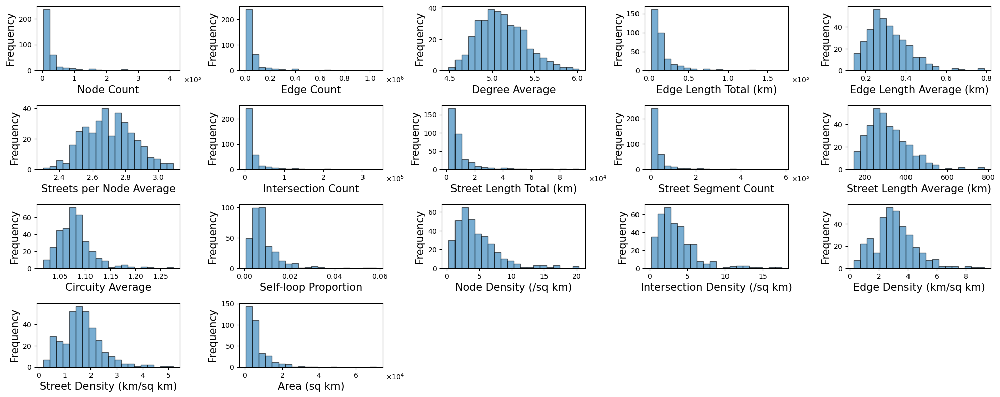

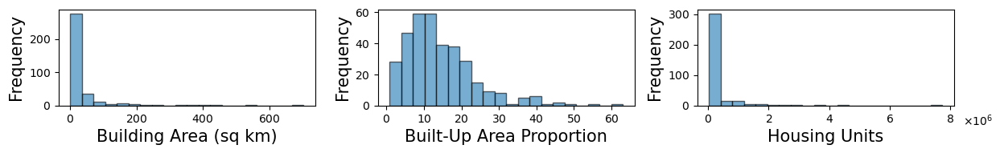

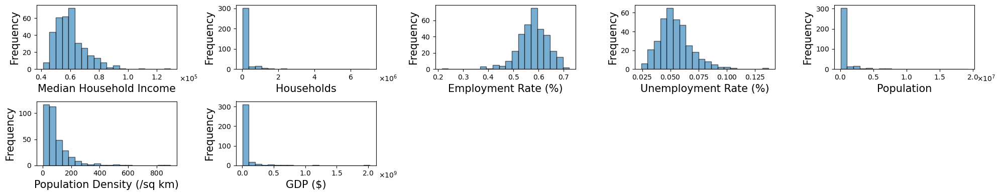

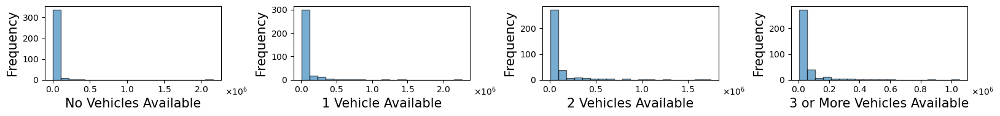

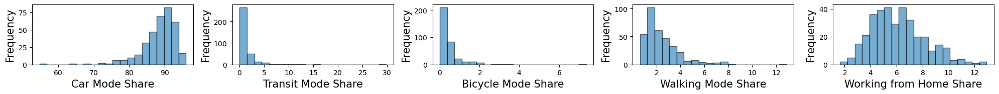

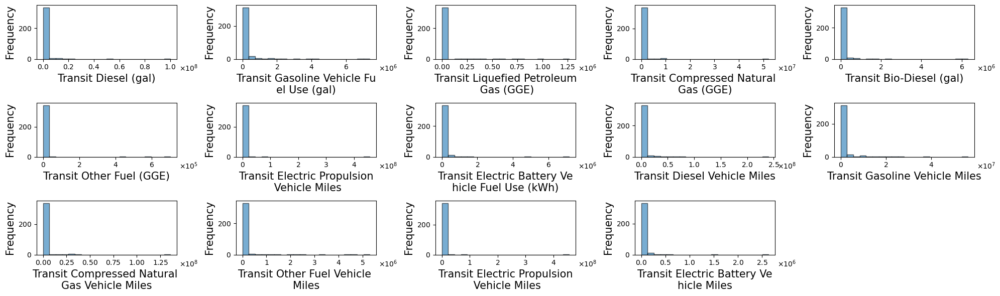

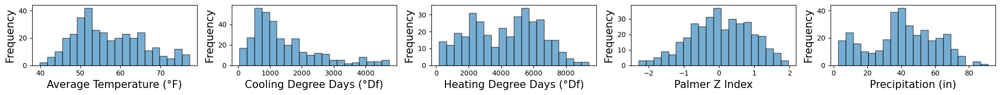

In [39]:



# Define categories for grouping the columns with variables ordered alphabetically and categories ranked according to the table
categories = {
    'Road Network': [
        'Node Count', 'Edge Count', 'Degree Average', 'Edge Length Total (km)', 'Edge Length Average (km)', 
        'Streets per Node Average', 'Intersection Count', 'Street Length Total (km)', 'Street Segment Count', 
        'Street Length Average (km)', 'Circuity Average', 'Self-loop Proportion', 
        'Node Density (/sq km)', 'Intersection Density (/sq km)', 'Edge Density (km/sq km)', 
        'Street Density (km/sq km)', 'Area (sq km)'
    ],
    'Buildings': [
        'Building Area (sq km)', 'Built-Up Area Proportion', 'Housing Units'
    ],
    'Socioeconomics': [
        'Median Household Income', 'Households', 'Employment Rate (%)', 'Unemployment Rate (%)', 
        'Population', 'Population Density (/sq km)', 'GDP ($)'
    ],
    'Car Ownership': [
        'No Vehicles Available', '1 Vehicle Available', '2 Vehicles Available',
        '3 or More Vehicles Available'
    ],
    'Commute (Mode Share)': [
        'Car Mode Share', 'Transit Mode Share', 'Bicycle Mode Share', 
        'Walking Mode Share', 'Working from Home Share'
    ],
    'Transit': [
        'Transit Diesel (gal)', 'Transit Gasoline Vehicle Fuel Use (gal)', 
        'Transit Liquefied Petroleum Gas (GGE)', 'Transit Compressed Natural Gas (GGE)', 
        'Transit Bio-Diesel (gal)', 'Transit Other Fuel (GGE)', 'Transit Electric Propulsion Vehicle Miles', 
        'Transit Electric Battery Vehicle Fuel Use (kWh)', 'Transit Diesel Vehicle Miles', 'Transit Gasoline Vehicle Miles', 
        'Transit Compressed Natural Gas Vehicle Miles', 'Transit Other Fuel Vehicle Miles', 
        'Transit Electric Propulsion Vehicle Miles', 'Transit Electric Battery Vehicle Miles'
    ],
    'Climate': [
        'Average Temperature (°F)', 'Cooling Degree Days (°Df)', 'Heating Degree Days (°Df)', 
        'Palmer Z Index', 'Precipitation (in)'
    ]
}


# Iterate over each category to create separate subfigures
for category, columns in categories.items():
    # Calculate layout based on the number of histograms in the category
    num_histograms = len(columns)
    ncols = 5  # Set a maximum of 5 columns for each row
    nrows = (num_histograms + ncols - 1) // ncols  # Calculate the number of rows
    
    # Create a figure for the category
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 2))
    axes = axes.flatten()  # Flatten axes for easier iteration

    # Plot histograms for the current category
    for idx, col in enumerate(columns):
        ax = axes[idx]
        ax.hist(factors_df[col], bins=20, alpha=0.6, edgecolor='black')

        # Split the label into two rows if it exceeds a certain length
        if len(col) > 30:  # Adjust the length threshold as needed
            col = col[:27] + '\n' + col[27:]

        ax.set_xlabel(col, fontsize=15)  # Use modified label as x-axis label
        ax.set_ylabel('Frequency', fontsize=15)
        ax.grid(False)

        # Set scientific notation for the axis tick labels
        ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.xaxis.get_major_formatter().set_scientific(True)
        ax.xaxis.get_major_formatter().set_powerlimits((-3, 4))
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.yaxis.get_major_formatter().set_scientific(True)
        ax.yaxis.get_major_formatter().set_powerlimits((-3, 4))
        
        # Move the offset text (scientific notation) to the far right
        offset_text = ax.xaxis.get_offset_text()
        offset_text.set_horizontalalignment('right')  # Align to the far right
        offset_text.set_verticalalignment('bottom')  # Align it properly with the axis
        offset_text.set_x(1.15)  # Position slightly beyond the far-right end

    # Remove any unused axes
    for i in range(len(columns), len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout to reduce overlap
    plt.tight_layout()

    # Save the figure for the category
    plt.savefig(f'../../figures/{category.lower().replace(" ", "_")}_histogram.jpg', dpi=600)
    plt.show()


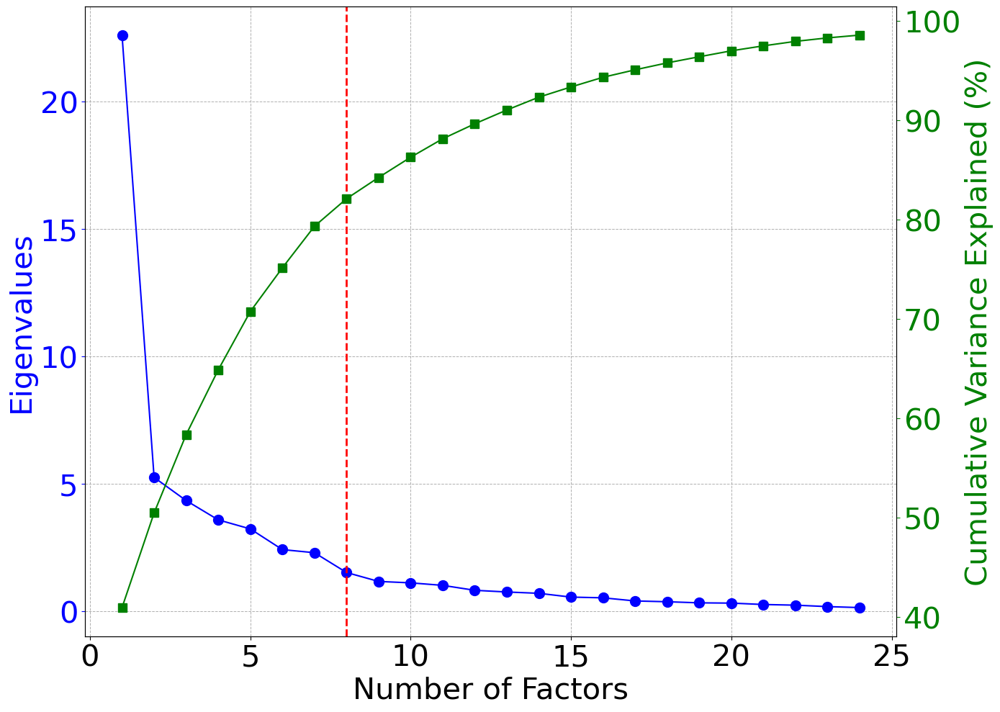

In [40]:


# Assuming `data_standardized` is already defined and standardized
pca = PCA()
pca.fit(data_standardized)

# Get the eigenvalues and cumulative proportion of variance explained
eigenvalues = pca.explained_variance_
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_) * 100  # Convert to cumulative percentage

# Define the number of factors to display
num_factors = 30

# Create the scree plot
fig, ax1 = plt.subplots(figsize=(14, 10))

# Primary y-axis (Eigenvalues)
ax1.plot(np.arange(1, num_factors - 5), eigenvalues[:24], 'o-', markersize=10, color='b', label='Eigenvalues')
ax1.set_xlabel('Number of Factors', fontsize=30)
ax1.set_ylabel('Eigenvalues', fontsize=30, color='b')
ax1.tick_params(axis='y', labelsize=30, colors='b')
ax1.tick_params(axis='x', labelsize=30)
ax1.grid(True, which='both', linestyle='--', linewidth=0.7)

# Add a vertical line at factor = 8
ax1.axvline(x=8, color='r', linestyle='--', linewidth=2)

# Secondary y-axis (Cumulative Proportion of Variance Explained)
ax2 = ax1.twinx()
ax2.plot(np.arange(1, num_factors - 5), cumulative_variance_ratio[:24], 's-', markersize=8, color='g', label='Cumulative Proportion of Variance Explained')
ax2.set_ylabel('Cumulative Variance Explained (%)', fontsize=30, color='g')
ax2.tick_params(axis='y', labelsize=30, colors='g')

# # Add a legend
# fig.legend(loc="upper right", fontsize=20)

# Adjust layout to fit elements better
plt.tight_layout()

# Save the figure
plt.savefig('../../figures/urban-scree-plot-with-cpve.jpg', dpi=600, bbox_inches='tight')

# Display the plot
plt.show()


In [41]:
data_standardized.to_csv('../../data/tidy/raw-data-standardized.csv', index=False)

In [42]:


# Assuming 'data_standardized' is your standardized data
# Define the range of numbers of factors to test
min_factors = 1
max_factors = 12  # Adjust as needed

# Initialize a dictionary to store statistics for each number of factors
statistics = {}



# Iterate over each number of factors
for n_factors in range(min_factors, max_factors + 1):
    # Initialize FactorAnalyzer with Maximum Likelihood method and no rotation
    fa = FactorAnalyzer(n_factors=n_factors, rotation='varimax', method='ml')
    
    # Fit the data
    fa.fit(data_standardized)
    
    # Get factor loadings
    factor_loadings = fa.loadings_
    
    
#     chi_square_value = fa.get_factor_variance()[2]
#     dof = data_standardized.shape[0] - n_factors - 1

    n_samples, n_variables = data_standardized.shape

    # Degrees of freedom for the null model
    dof_null = (n_variables * (n_variables + 1)) / 2

    # Approximate chi-square value for the null model
    # This is a rough estimate; you may need to adjust based on your data
    chi_square_null = dof_null * (n_samples - 1)
    dof = data_standardized.shape[0] - n_factors - 1

    
    # Calculate RMSR
    residuals = fa.get_uniquenesses()
    squared_residuals = np.square(residuals)
    sum_squared_residuals = np.sum(squared_residuals)
    RMSR = np.sqrt(sum_squared_residuals / dof)
    
    # Calculate RMSEA
    communalities = fa.get_communalities()
    mean_communalities = np.mean(communalities)
    RMSEA = np.sqrt(mean_communalities / dof)
    

    
    
    # Calculate statistics
    chi_square_value = fa.get_factor_variance()[2].sum()
    dof = data_standardized.shape[0] - n_factors - 1
    
    TLI = 1 - (chi_square_value / dof) / (chi_square_null / dof_null)
    BIC = chi_square_value + n_factors * np.log(n_samples)
    variance_explained = fa.get_factor_variance()[0].sum()
    cumulative_variance = fa.get_factor_variance()[2][-1]
    
    # Store statistics in the dictionary
    statistics[n_factors] = {
        'Chi-Square Value': chi_square_value.mean(),
        'Degrees of Freedom': dof,
        'RMS': RMSR,
        'RMSEA': RMSEA,
        'BIC': BIC.mean(),
        'TLI': TLI.mean(),
        'Variance Explained': variance_explained,
        'Cumulative Variance': cumulative_variance
    }

# Create DataFrame to hold the statistics
metrics = ['Chi-Square Value', 'Degrees of Freedom', 'RMS', 'RMSEA', 'BIC', 'TLI', 'Variance Explained', 'Cumulative Variance']
comparison_df = pd.DataFrame(index=metrics)

# Populate the DataFrame with the average statistics for each number of factors
for n_factors, stats in statistics.items():
    for metric, value in stats.items():
        comparison_df.loc[metric, f'{n_factors} Factors'] = value


# metrics = ['Chi-Square Value', 'Degrees of Freedom', 'RMSR', 'RMSEA', 'BIC', 'TLI', 'Variance Explained', 'Cumulative Variance']
# comparison_df = pd.DataFrame(index=metrics)

# # Iterate over each number of factors
# for n_factors, stats in statistics.items():
#     for metric, value in stats.items():
#         # Ensure the metric is in the index and assign value to the corresponding column
#         if metric in metrics:
#             comparison_df.loc[metric, f'{n_factors} Factors'] = value

# Print the comparison DataFrame
comparison_df


C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:443: RuntimeWarning: invalid value encountered in log
  error = -(np.sum(np.log(values) - values) - n_factors + corr_mtx.shape[0])
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:574: UserWarning: Failed to converge: ABNORMAL_TERMINATION_IN_LNSRCH
  warnings.warn(f"Failed to converge: {res.message}")
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:663: UserWarning: No rotation will be performed when the number of factors equals 1.
  warnings.warn(
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:443: RuntimeWarning: invalid value encountered in log
  error = -(np.sum(np.log(values) - values) - n_factors + corr_mtx.shape[0])
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:574: UserWarning: Failed to 

,1 Factors,2 Factors,3 Factors,4 Factors,5 Factors,6 Factors,7 Factors,8 Factors,9 Factors,10 Factors,11 Factors,12 Factors
Chi-Square Value,0.405737,0.884581,1.431084,1.852641,2.366227,3.054451,3.752187,4.567221,5.292323,6.176845,7.018132,7.853516
Degrees of Freedom,347.000000,346.000000,345.000000,344.000000,343.000000,342.000000,341.000000,340.000000,339.000000,338.000000,337.000000,336.000000
RMS,0.276090,0.243866,0.224814,0.208330,0.196174,0.176625,0.163342,0.143041,0.138508,0.131714,0.127624,0.123551
RMSEA,0.034195,0.037797,0.040366,0.042528,0.044143,0.045528,0.046694,0.047973,0.048474,0.049005,0.049332,0.049667
BIC,6.260809,12.594725,18.996300,25.272928,31.641587,38.184883,44.737691,51.407796,57.987971,64.727564,71.423923,78.114379
TLI,0.999997,0.999993,0.999988,0.999985,0.999980,0.999974,0.999968,0.999961,0.999955,0.999947,0.999940,0.999933
Variance Explained,22.315532,27.185943,30.918356,34.219891,36.761068,38.988679,40.892814,43.035694,43.810201,44.644599,45.108111,45.586135
Cumulative Variance,0.405737,0.494290,0.562152,0.622180,0.668383,0.708885,0.743506,0.782467,0.796549,0.811720,0.820147,0.828839


In [43]:
fa = FactorAnalyzer(n_factors=8, rotation='varimax', method='ml')
    
    # Fit the data
fa.fit(data_standardized)
fa.sufficiency(data_standardized.shape[0])

C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:443: RuntimeWarning: invalid value encountered in log
  error = -(np.sum(np.log(values) - values) - n_factors + corr_mtx.shape[0])
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:574: UserWarning: Failed to converge: ABNORMAL_TERMINATION_IN_LNSRCH
  warnings.warn(f"Failed to converge: {res.message}")


(nan, 1073, nan)

C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:443: RuntimeWarning: invalid value encountered in log
  error = -(np.sum(np.log(values) - values) - n_factors + corr_mtx.shape[0])
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:574: UserWarning: Failed to converge: ABNORMAL_TERMINATION_IN_LNSRCH
  warnings.warn(f"Failed to converge: {res.message}")


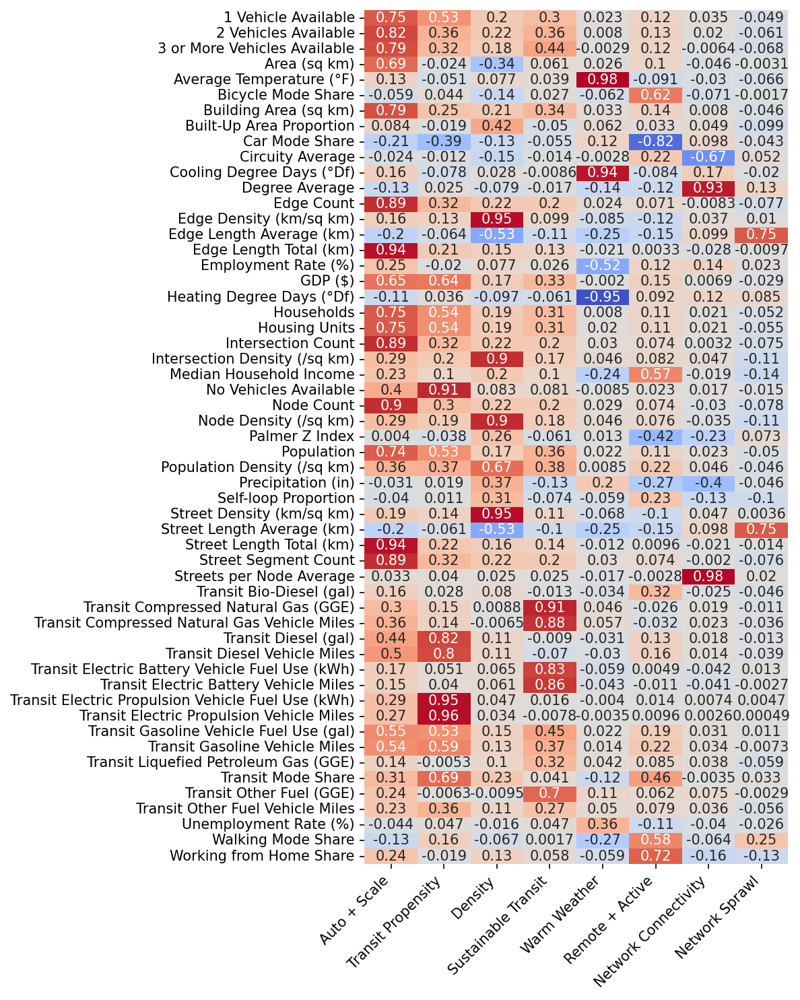

In [44]:
# Define the number of factors to retain
n_factors = 8

# Define factor names
factor_names = [
    'Auto + Scale',
    'Transit Propensity',
    'Density',
    'Sustainable Transit',
    'Warm Weather',
    'Remote + Active',
    'Network Connectivity',
    'Network Sprawl'
]

# Perform Factor Analysis for 'varimax' rotation
rotation = 'varimax'
fa = FactorAnalyzer(n_factors=n_factors, rotation=rotation, method='ml')

# Assuming data_standardized is already defined and standardized
fa.fit(data_standardized)

# Get factor loadings
varimax_loadings = fa.loadings_

# Sort variable names in alphabetical order
sorted_variables = sorted(data_standardized.columns)

# Reorder the factor loadings based on the sorted variable names
varimax_loadings_sorted = varimax_loadings[[data_standardized.columns.get_loc(var) for var in sorted_variables], :]

# Plot the factor loadings heatmap for 'varimax'
fig, ax = plt.subplots(figsize=(8, 10), dpi=150)  # Adjust figsize and dpi

sns.heatmap(varimax_loadings_sorted, annot=True, cmap='coolwarm', center=0, cbar=False, ax=ax)

# Set x-tick labels to factor names
plt.xticks(ticks=np.arange(n_factors) + 0.5, labels=factor_names, fontsize=10, rotation=45, ha='right')
plt.xlabel('')

# Set y-tick labels to the sorted variable names and center them
plt.yticks(ticks=np.arange(len(sorted_variables)) + 0.5, labels=sorted_variables, fontsize=10, rotation=0)
plt.ylabel('')

# Final layout adjustments and save the plot
plt.tight_layout()
plt.savefig('../../figures/varimax-loading-plots.jpg', dpi=600, bbox_inches='tight')
plt.show()

C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:443: RuntimeWarning: invalid value encountered in log
  error = -(np.sum(np.log(values) - values) - n_factors + corr_mtx.shape[0])
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\factor_analyzer\factor_analyzer.py:574: UserWarning: Failed to converge: ABNORMAL_TERMINATION_IN_LNSRCH
  warnings.warn(f"Failed to converge: {res.message}")


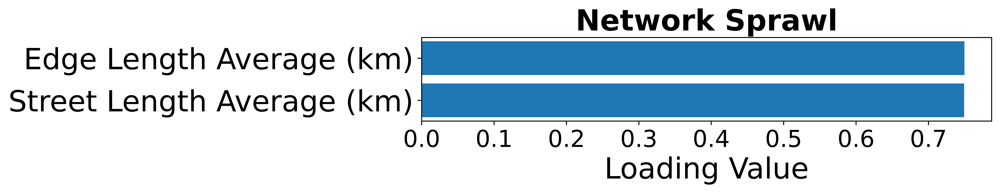

In [45]:


# Define the number of factors to retain
n_factors = 8

# Define factor names
factor_names = [
    'Auto + Scale',
    'Transit Propensity',
    'Density',
    'Sustainable Transit',
    'Warm Weather',
    'Remote + Active',
    'Network Connectivity',
    'Network Sprawl'
]

# Perform Factor Analysis for 'varimax' rotation
rotation = 'varimax'
fa = FactorAnalyzer(n_factors=n_factors, rotation=rotation, method='ml')
fa.fit(data_standardized)

# Get factor loadings
varimax_loadings = fa.loadings_

# Set a fixed figure width and a relative bar height
fixed_figure_width = 12  # Set the figure width to be consistent
bar_height = 0.8  # Set a fixed height for the bars

# Iterate over each factor and create a bar plot for the variables with loading > 0.5
for i in range(n_factors):
    # Get the loadings for the i-th factor
    factor_loadings = varimax_loadings[:, i]
    
    # Get the indices of variables with a loading greater than 0.5 (in absolute value)
    significant_indices = np.abs(factor_loadings) > 0.6
    
    # Get the variable names and their corresponding loadings
    significant_variables = data_standardized.columns[significant_indices]
    significant_loadings = factor_loadings[significant_indices]
    
    if len(significant_variables) > 0:  # Only create the plot if there are significant variables
        # Sort the variables by loading value in descending order
        sorted_indices = np.argsort(np.abs(significant_loadings))[::-1]
        sorted_variables = significant_variables[sorted_indices]
        sorted_loadings = significant_loadings[sorted_indices]
        
        # Create a new figure for each factor, with width based on number of variables
        num_variables = len(sorted_variables)
        fig_height = (num_variables + 1) * bar_height  # Set the height based on number of bars
        plt.figure(figsize=(fixed_figure_width, fig_height), dpi=1200)
        
        # Color the bars based on whether the loading is positive or negative
        bar_colors = ['#1f77b4' if loading > 0 else '#d62728' for loading in sorted_loadings]
        
        # Create a bar plot with bars ordered from largest to smallest from top to bottom
        plt.barh(sorted_variables[::-1], sorted_loadings[::-1], color=bar_colors[::-1], height=bar_height)
        
        # Set the title for the plot
        plt.title(f'{factor_names[i]}', fontsize=25, weight='bold')
        
        # Set x-axis label
        plt.xlabel('Loading Value', fontsize=25)
        
        # Set y-axis label
        plt.ylabel('', fontsize=25)
        
        # Increase tick size
        plt.xticks(fontsize=20)  # Increase x-axis tick size
        plt.yticks(fontsize=25)  # Increase y-axis tick size
        
        # Adjust subplot layout to make sure there is no extra space
        plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

        # Save the plot to a specific folder, using the factor name for the filename
        plt.tight_layout()
        plt.savefig(f'../../figures/{factor_names[i].strip()}_factor_loading_plot.jpg', dpi=1200, bbox_inches='tight')
